<a href="https://colab.research.google.com/github/SrKing00/MLH16803_P3_DC/blob/main/MLH_16803_p3_Daniel.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Machine Learning in Healthcare

**Practise 3*: Drug discovery modelling***

**Professor**: Fernando Pozo

**Starting date**: November 16, 2021

**Due date**: November 30, 2021

**Degree**: B.Sc. in Data Science and Engineering

**Course**: 2021-2022

---

# Introduction

First of all, in case you are not familiarized with Google Colab, follow this [overview of colaboratory feature](https://colab.research.google.com/notebooks/basic_features_overview.ipynb) or feel free googling for it.

## Getting data from [ChEMBL](https://www.ebi.ac.uk/chembl/)

The ChEMBL Database is a database that contains curated bioactivity data of more than 2 million compounds. It is compiled from more than 76,000 documents, 1.2 million assays and the data spans 13,000 targets and 1,800 cells and 33,000 indications. This data cames from ChEMBL version 26.

The online interactive documentation is available for both ChEMBL web services is available through [this link](https://chembl.gitbook.io/chembl-interface-documentation/web-services).


In [ ]:
#@title Installing 3rd party libraries

!pip install chembl_webresource_client
!pip install rdkit-pypi
!pip install dataprep

     |████████████████████████████████| 55 kB 1.7 MB/s 
     |████████████████████████████████| 596 kB 11.4 MB/s 
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13
  Attempting uninstall: itsdangerous
    Found existing installation: itsdangerous 1.1.0
    Uninstalling itsdangerous-1.1.0:
      Successfully uninstalled itsdangerous-1.1.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
flask 1.1.4 requires itsdangerous<2.0,>=0.24, but you have itsdangerous 2.0.1 which is incompatible.
     |████████████████████████████████| 20.6 MB 1.2 MB/s 
     |████████████████████████████████| 3.5 MB 5.1 MB/s 
     |████████████████████████████████| 1.1 MB 54.2 MB/s 
     |████████████████████████████████| 158 kB 77.6 MB/s 
     |████████████████████████████████| 366 kB 63.9 MB

In [ ]:
#@title Importing 3rd party libraries

import pandas as pd
import numpy as np
from numpy.random import seed, randn
from scipy.stats import mannwhitneyu

from dataprep.eda import create_report
from rdkit import Chem
from rdkit.Chem import Descriptors, Lipinski
from chembl_webresource_client.new_client import new_client

NumExpr defaulting to 2 threads.


In [ ]:
#@title Downloading required data

!wget https://github.com/dataprofessor/bioinformatics/raw/master/padel.zip
!wget https://github.com/dataprofessor/bioinformatics/raw/master/padel.sh

--2021-11-28 11:15:10--  https://github.com/dataprofessor/bioinformatics/raw/master/padel.zip
Resolving github.com (github.com)... 140.82.112.3
Connecting to github.com (github.com)|140.82.112.3|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/dataprofessor/bioinformatics/master/padel.zip [following]
--2021-11-28 11:15:10--  https://raw.githubusercontent.com/dataprofessor/bioinformatics/master/padel.zip
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 25768637 (25M) [application/zip]
Saving to: ‘padel.zip’

padel.zip           100%[===================>]  24.57M   140MB/s    in 0.2s    

2021-11-28 11:15:11 (140 MB/s) - ‘padel.zip’ saved [25768637/25768637]

--2021-11-28 11:15:11--  https://github

In [ ]:
#@title My functions

def target_search(name:str) -> pd.DataFrame:
  """Calling to chembl webresource client to get targets desired and convert the 
  result in a pandas DataFrame.

    Args:
        name (str): keyword to look for.

    Returns:
        pd.DataFrame with results.
  """
  return pd.DataFrame.from_dict(new_client.target.search(name))


def bioactivity_search(target_id:str, filter_type:str=False) -> pd.DataFrame:
  """Calling to chembl webresource client to get bioactivity desired and convert 
  the result in a pandas DataFrame.

    Args:
        target_id (str): target identifier to look for.
        filter_type (str): target identifier to look for.

    Returns:
        pd.DataFrame with results.
  """
  filter_dict =  new_client.activity.filter(target_chembl_id=target_id)
  if filter_type:
    filter_dict = filter_dict.filter(standard_type=filter_type)
  return pd.DataFrame.from_dict(filter_dict)

def lipinski(smiles, verbose=False):
    """
    https://codeocean.com/explore/capsules?query=tag:data-curation
    """
    moldata= []
    for elem in smiles:
        mol=Chem.MolFromSmiles(elem) 
        moldata.append(mol)
       
    baseData= np.arange(1,1)
    i=0  
    for mol in moldata:        
       
        desc_MolWt = Descriptors.MolWt(mol)
        desc_MolLogP = Descriptors.MolLogP(mol)
        desc_NumHDonors = Lipinski.NumHDonors(mol)
        desc_NumHAcceptors = Lipinski.NumHAcceptors(mol)
           
        row = np.array([desc_MolWt,
                        desc_MolLogP,
                        desc_NumHDonors,
                        desc_NumHAcceptors])   
    
        if(i==0):
            baseData=row
        else:
            baseData=np.vstack([baseData, row])
        i=i+1      
    
    columnNames=["MW","LogP","NumHDonors","NumHAcceptors"]   
    descriptors = pd.DataFrame(data=baseData,columns=columnNames)
    
    return descriptors


def pIC50(input):
    """
    https://github.com/chaninlab/estrogen-receptor-alpha-qsar/blob/master/02_ER_alpha_RO5.ipynb
    """
    pIC50 = []

    for i in input['standard_value_norm']:
        molar = i*(10**-9) # Converts nM to M
        pIC50.append(-np.log10(molar))

    input['pIC50'] = pIC50
    x = input.drop('standard_value_norm', 1)
        
    return x


def mannwhitney(df, descriptor, verbose=False):
    """
    https://machinelearningmastery.com/nonparametric-statistical-significance-tests-in-python/
    """

    # seed the random number generator
    seed(1)

    # actives and inactives
    selection = [descriptor, 'bioactivity_class']
    df = df[selection]
    active = df[df['bioactivity_class'] == 'active']
    active = active[descriptor]

    selection = [descriptor, 'bioactivity_class']
    df = df[selection]
    inactive = df[df['bioactivity_class'] == 'inactive']
    inactive = inactive[descriptor]

    stat, p = mannwhitneyu(active, inactive)

    alpha = 0.05
    if p > alpha:
      interpretation = 'Same distribution (fail to reject H0)'
    else:
      interpretation = 'Different distribution (reject H0)'

    results = pd.DataFrame({'Descriptor':descriptor,
                            'Statistics':stat,
                            'p':p,
                            'alpha':alpha,
                            'Interpretation':interpretation}, index=[0])
    return results


def norm_value(input):
    norm = []

    for i in input['standard_value']:
        if i > 100000000:
          i = 100000000
        norm.append(i)

    input['standard_value_norm'] = norm
    x = input.drop('standard_value', 1)
        
    return x

# Disease, target or molecule to study

## Target search for Coronavirus

In [ ]:
df_target = target_search('coronavirus')
df_target

https://www.ebi.ac.uk/chembl/api/data/target/search.json
[('q', 'coronavirus'), ('limit', 20), ('offset', 0)]
From cache: False


,cross_references,organism,pref_name,score,species_group_flag,target_chembl_id,target_components,target_type,tax_id
0,[],Coronavirus,Coronavirus,17.0,False,CHEMBL613732,[],ORGANISM,11119
1,[],SARS coronavirus,SARS coronavirus,15.0,False,CHEMBL612575,[],ORGANISM,227859
2,[],Feline coronavirus,Feline coronavirus,15.0,False,CHEMBL612744,[],ORGANISM,12663
3,[],Human coronavirus 229E,Human coronavirus 229E,13.0,False,CHEMBL613837,[],ORGANISM,11137
4,"[{'xref_id': 'P0C6U8', 'xref_name': None, 'xre...",SARS coronavirus,SARS coronavirus 3C-like proteinase,10.0,False,CHEMBL3927,"[{'accession': 'P0C6U8', 'component_descriptio...",SINGLE PROTEIN,227859
5,[],Middle East respiratory syndrome-related coron...,Middle East respiratory syndrome-related coron...,9.0,False,CHEMBL4296578,[],ORGANISM,1335626
6,"[{'xref_id': 'P0C6X7', 'xref_name': None, 'xre...",SARS coronavirus,Replicase polyprotein 1ab,4.0,False,CHEMBL5118,"[{'accession': 'P0C6X7', 'component_descriptio...",SINGLE PROTEIN,227859
7,[],Severe acute respiratory syndrome coronavirus 2,Replicase polyprotein 1ab,4.0,False,CHEMBL4523582,"[{'accession': 'P0DTD1', 'component_descriptio...",SINGLE PROTEIN,2697049


## Bioactivity data for SARS coronavirus


Here, we will retrieve only bioactivity data for Coronavirus (CHEMBL3927) that are reported as pChEMBL values. In our case, we are interested in [IC50](https://en.wikipedia.org/wiki/IC50).


In [ ]:
df_ic50 = bioactivity_search(target_id=df_target['target_chembl_id'][4], filter_type='IC50')
df_ic50 = df_ic50[~df_ic50['standard_value'].isna()]
df_ic50 = df_ic50[~df_ic50['canonical_smiles'].isna()]

https://www.ebi.ac.uk/chembl/api/data/activity.json
[('target_chembl_id', 'CHEMBL3927'), ('standard_type', 'IC50'), ('limit', 20), ('offset', 0)]
From cache: False
https://www.ebi.ac.uk/chembl/api/data/activity.json
[('target_chembl_id', 'CHEMBL3927'), ('standard_type', 'IC50'), ('limit', 20), ('offset', 20)]
From cache: False
https://www.ebi.ac.uk/chembl/api/data/activity.json
[('target_chembl_id', 'CHEMBL3927'), ('standard_type', 'IC50'), ('limit', 20), ('offset', 40)]
From cache: False
https://www.ebi.ac.uk/chembl/api/data/activity.json
[('target_chembl_id', 'CHEMBL3927'), ('standard_type', 'IC50'), ('limit', 20), ('offset', 60)]
From cache: False
https://www.ebi.ac.uk/chembl/api/data/activity.json
[('target_chembl_id', 'CHEMBL3927'), ('standard_type', 'IC50'), ('limit', 20), ('offset', 80)]
From cache: False
https://www.ebi.ac.uk/chembl/api/data/activity.json
[('target_chembl_id', 'CHEMBL3927'), ('standard_type', 'IC50'), ('limit', 20), ('offset', 100)]
From cache: False
https://ww

In [ ]:
df_ic50_nr = df_ic50.drop_duplicates(['canonical_smiles'])
df_ic50_nr = df_ic50_nr[['molecule_chembl_id','canonical_smiles','standard_value']]
df_ic50_nr['standard_value'] = df_ic50_nr['standard_value'].astype(float)

In [ ]:
df_ic50_nr.loc[df_ic50_nr['standard_value'] >= 10000, 'bioactivity_class'] = 'inactive'
df_ic50_nr.loc[df_ic50_nr['standard_value'] <= 1000, 'bioactivity_class'] = 'active'
df_ic50_nr.loc[df_ic50_nr['bioactivity_class'].isnull(), 'bioactivity_class'] = 'intermediate'

In [ ]:
df_ic50_nr

,molecule_chembl_id,canonical_smiles,standard_value,bioactivity_class
0,CHEMBL187579,Cc1noc(C)c1CN1C(=O)C(=O)c2cc(C#N)ccc21,7200.0,intermediate
1,CHEMBL188487,O=C1C(=O)N(Cc2ccc(F)cc2Cl)c2ccc(I)cc21,9400.0,intermediate
2,CHEMBL185698,O=C1C(=O)N(CC2COc3ccccc3O2)c2ccc(I)cc21,13500.0,inactive
3,CHEMBL426082,O=C1C(=O)N(Cc2cc3ccccc3s2)c2ccccc21,13110.0,inactive
4,CHEMBL187717,O=C1C(=O)N(Cc2cc3ccccc3s2)c2c1cccc2[N+](=O)[O-],2000.0,intermediate
...,...,...,...,...
109,CHEMBL2146517,COC(=O)[C@@]1(C)CCCc2c1ccc1c2C(=O)C(=O)c2c(C)c...,21100.0,inactive
110,CHEMBL187460,C[C@H]1COC2=C1C(=O)C(=O)c1c2ccc2c1CCCC2(C)C,226700.0,inactive
111,CHEMBL363535,Cc1coc2c1C(=O)C(=O)c1c-2ccc2c(C)cccc12,38700.0,inactive
112,CHEMBL227075,Cc1cccc2c3c(ccc12)C1=C(C(=O)C3=O)[C@@H](C)CO1,14400.0,inactive


# Feature engineering

## Lipinski descriptors

Christopher Lipinski, a scientist at Pfizer, came up with a set of rule-of-thumb for evaluating the **druglikeness** of compounds. Such druglikeness is based on the Absorption, Distribution, Metabolism and Excretion (ADME) that is also known as the pharmacokinetic profile. Lipinski analyzed all orally active FDA-approved drugs in the formulation of what is to be known as the **Rule-of-Five** or **Lipinski's Rule**.

The [Lipinski's Rule](https://en.wikipedia.org/wiki/Lipinski%27s_rule_of_five) stated the following:

- Molecular weight < 500 Dalton
- Octanol-water partition coefficient (LogP) < 5
- Hydrogen bond donors < 5
- Hydrogen bond acceptors < 10



In [ ]:
df_ic50_nr_lipinski = lipinski(df_ic50_nr['canonical_smiles'])

In [ ]:
df_features = pd.concat([df_ic50_nr, df_ic50_nr_lipinski], axis=1)

In [ ]:
df_features

,molecule_chembl_id,canonical_smiles,standard_value,bioactivity_class,MW,LogP,NumHDonors,NumHAcceptors
0,CHEMBL187579,Cc1noc(C)c1CN1C(=O)C(=O)c2cc(C#N)ccc21,7200.0,intermediate,281.271,1.89262,0.0,5.0
1,CHEMBL188487,O=C1C(=O)N(Cc2ccc(F)cc2Cl)c2ccc(I)cc21,9400.0,intermediate,415.589,3.81320,0.0,2.0
2,CHEMBL185698,O=C1C(=O)N(CC2COc3ccccc3O2)c2ccc(I)cc21,13500.0,inactive,421.190,2.66050,0.0,4.0
3,CHEMBL426082,O=C1C(=O)N(Cc2cc3ccccc3s2)c2ccccc21,13110.0,inactive,293.347,3.63080,0.0,3.0
4,CHEMBL187717,O=C1C(=O)N(Cc2cc3ccccc3s2)c2c1cccc2[N+](=O)[O-],2000.0,intermediate,338.344,3.53900,0.0,5.0
...,...,...,...,...,...,...,...,...
109,CHEMBL2146517,COC(=O)[C@@]1(C)CCCc2c1ccc1c2C(=O)C(=O)c2c(C)c...,21100.0,inactive,NaN,NaN,NaN,NaN
110,CHEMBL187460,C[C@H]1COC2=C1C(=O)C(=O)c1c2ccc2c1CCCC2(C)C,226700.0,inactive,NaN,NaN,NaN,NaN
111,CHEMBL363535,Cc1coc2c1C(=O)C(=O)c1c-2ccc2c(C)cccc12,38700.0,inactive,NaN,NaN,NaN,NaN
112,CHEMBL227075,Cc1cccc2c3c(ccc12)C1=C(C(=O)C3=O)[C@@H](C)CO1,14400.0,inactive,NaN,NaN,NaN,NaN


## IC50 to pIC50

To allow IC50 data to be more uniformly distributed, we will convert IC50 to the negative logarithmic scale which is essentially -log10(IC50).

This custom function pIC50() will accept a DataFrame as input and will:

- Take the IC50 values from the standard_value column and converts it from nM to M by multiplying the value by 10$^{-9}$
- Take the molar value and apply -log10
- Delete the standard_value column and create a new pIC50 column

In [ ]:
df_features_norm = norm_value(df_features)
df_features_norm = pIC50(df_features_norm)

In [ ]:
df_features_norm.head()

,molecule_chembl_id,canonical_smiles,bioactivity_class,MW,LogP,NumHDonors,NumHAcceptors,pIC50
0,CHEMBL187579,Cc1noc(C)c1CN1C(=O)C(=O)c2cc(C#N)ccc21,intermediate,281.271,1.89262,0.0,5.0,5.142668
1,CHEMBL188487,O=C1C(=O)N(Cc2ccc(F)cc2Cl)c2ccc(I)cc21,intermediate,415.589,3.81320,0.0,2.0,5.026872
2,CHEMBL185698,O=C1C(=O)N(CC2COc3ccccc3O2)c2ccc(I)cc21,inactive,421.190,2.66050,0.0,4.0,4.869666
3,CHEMBL426082,O=C1C(=O)N(Cc2cc3ccccc3s2)c2ccccc21,inactive,293.347,3.63080,0.0,3.0,4.882397
4,CHEMBL187717,O=C1C(=O)N(Cc2cc3ccccc3s2)c2c1cccc2[N+](=O)[O-],intermediate,338.344,3.53900,0.0,5.0,5.698970


## Exploratory data analysis

In [ ]:
report = create_report(df_features_norm, title='My drugs report')

My drugs report
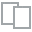
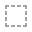
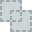
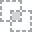
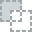
...
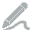
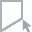
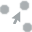
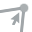
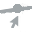

In [ ]:
report

In [ ]:
mannwhitney(df_features_norm, 'NumHDonors')

,Descriptor,Statistics,p,alpha,Interpretation
0,NumHDonors,220.0,0.002885,0.05,Different distribution (reject H0)


## PaDEL-Descriptor

In [ ]:
!unzip padel.zip

Archive:  padel.zip
   creating: PaDEL-Descriptor/
  inflating: __MACOSX/._PaDEL-Descriptor  
  inflating: PaDEL-Descriptor/MACCSFingerprinter.xml  
  inflating: __MACOSX/PaDEL-Descriptor/._MACCSFingerprinter.xml  
  inflating: PaDEL-Descriptor/AtomPairs2DFingerprinter.xml  
  inflating: __MACOSX/PaDEL-Descriptor/._AtomPairs2DFingerprinter.xml  
  inflating: PaDEL-Descriptor/EStateFingerprinter.xml  
  inflating: __MACOSX/PaDEL-Descriptor/._EStateFingerprinter.xml  
  inflating: PaDEL-Descriptor/Fingerprinter.xml  
  inflating: __MACOSX/PaDEL-Descriptor/._Fingerprinter.xml  
  inflating: PaDEL-Descriptor/.DS_Store  
  inflating: __MACOSX/PaDEL-Descriptor/._.DS_Store  
   creating: PaDEL-Descriptor/license/
  inflating: __MACOSX/PaDEL-Descriptor/._license  
  inflating: PaDEL-Descriptor/KlekotaRothFingerprintCount.xml  
  inflating: __MACOSX/PaDEL-Descriptor/._KlekotaRothFingerprintCount.xml  
  inflating: PaDEL-Descriptor/config  
  inflating: __MACOSX/PaDEL-Descriptor/._config  
  inf

#### Setup

Below, import the set of libraries you are going to use to follow this hands-on.

In [ ]:
selection = ['canonical_smiles','molecule_chembl_id']
df3_selection = df_features_norm[selection]
df3_selection.to_csv('molecule.smi', sep='\t', index=False, header=False)

In [ ]:
!cat molecule.smi | head -5

Cc1noc(C)c1CN1C(=O)C(=O)c2cc(C#N)ccc21	CHEMBL187579
O=C1C(=O)N(Cc2ccc(F)cc2Cl)c2ccc(I)cc21	CHEMBL188487
O=C1C(=O)N(CC2COc3ccccc3O2)c2ccc(I)cc21	CHEMBL185698
O=C1C(=O)N(Cc2cc3ccccc3s2)c2ccccc21	CHEMBL426082
O=C1C(=O)N(Cc2cc3ccccc3s2)c2c1cccc2[N+](=O)[O-]	CHEMBL187717


In [ ]:
!cat molecule.smi | wc -l

114


In [ ]:
!cat padel.sh

java -Xms1G -Xmx1G -Djava.awt.headless=true -jar ./PaDEL-Descriptor/PaDEL-Descriptor.jar -removesalt -standardizenitro -fingerprints -descriptortypes ./PaDEL-Descriptor/PubchemFingerprinter.xml -dir ./ -file descriptors_output.csv


In [ ]:
!bash padel.sh

Processing CHEMBL187579 in molecule.smi (1/23). 
Processing CHEMBL188487 in molecule.smi (2/23). 
Processing CHEMBL185698 in molecule.smi (3/23). Average speed: 1.81 s/mol.
Processing CHEMBL426082 in molecule.smi (4/23). Average speed: 1.00 s/mol.
Processing CHEMBL187717 in molecule.smi (5/23). Average speed: 0.81 s/mol.
Processing CHEMBL365134 in molecule.smi (6/23). Average speed: 0.71 s/mol.
Processing CHEMBL187598 in molecule.smi (7/23). Average speed: 0.66 s/mol.
Processing CHEMBL190743 in molecule.smi (8/23). Average speed: 0.60 s/mol.
Processing CHEMBL365469 in molecule.smi (9/23). Average speed: 0.57 s/mol.
Processing CHEMBL191575 in molecule.smi (11/23). Average speed: 0.53 s/mol.
Processing CHEMBL188983 in molecule.smi (10/23). Average speed: 0.54 s/mol.
Processing CHEMBL370923 in molecule.smi (12/23). Average speed: 0.49 s/mol.
Processing CHEMBL194398 in molecule.smi (13/23). Average speed: 0.48 s/mol.
Processing CHEMBL196635 in molecule.smi (14/23). Average speed: 0.45 s/mo

In [ ]:
df_x = pd.read_csv('descriptors_output.csv')

In [ ]:
df_y = df_features_norm['pIC50']

In [ ]:
df_features_bool = pd.concat([df_x, df_y], axis=1)
df_features_bool = df_features_bool[~df_features_bool['Name'].isna()].reset_index(drop=True)

In [ ]:
df_features_bool

,Name,PubchemFP0,PubchemFP1,PubchemFP2,PubchemFP3,PubchemFP4,PubchemFP5,PubchemFP6,PubchemFP7,PubchemFP8,PubchemFP9,PubchemFP10,PubchemFP11,PubchemFP12,PubchemFP13,PubchemFP14,PubchemFP15,PubchemFP16,PubchemFP17,PubchemFP18,PubchemFP19,PubchemFP20,PubchemFP21,PubchemFP22,PubchemFP23,PubchemFP24,PubchemFP25,PubchemFP26,PubchemFP27,PubchemFP28,PubchemFP29,PubchemFP30,PubchemFP31,PubchemFP32,PubchemFP33,PubchemFP34,PubchemFP35,PubchemFP36,PubchemFP37,PubchemFP38,...,PubchemFP842,PubchemFP843,PubchemFP844,PubchemFP845,PubchemFP846,PubchemFP847,PubchemFP848,PubchemFP849,PubchemFP850,PubchemFP851,PubchemFP852,PubchemFP853,PubchemFP854,PubchemFP855,PubchemFP856,PubchemFP857,PubchemFP858,PubchemFP859,PubchemFP860,PubchemFP861,PubchemFP862,PubchemFP863,PubchemFP864,PubchemFP865,PubchemFP866,PubchemFP867,PubchemFP868,PubchemFP869,PubchemFP870,PubchemFP871,PubchemFP872,PubchemFP873,PubchemFP874,PubchemFP875,PubchemFP876,PubchemFP877,PubchemFP878,PubchemFP879,PubchemFP880,pIC50
0,CHEMBL187579,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.142668
1,CHEMBL188487,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.026872
2,CHEMBL185698,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.869666
3,CHEMBL426082,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.882397
4,CHEMBL187717,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.698970
5,CHEMBL365134,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.008774
6,CHEMBL187598,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.316953
7,CHEMBL190743,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.022276
8,CHEMBL365469,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,

In [ ]:
df_features_norm

,molecule_chembl_id,canonical_smiles,bioactivity_class,MW,LogP,NumHDonors,NumHAcceptors,pIC50
0,CHEMBL187579,Cc1noc(C)c1CN1C(=O)C(=O)c2cc(C#N)ccc21,intermediate,281.271,1.89262,0.0,5.0,5.142668
1,CHEMBL188487,O=C1C(=O)N(Cc2ccc(F)cc2Cl)c2ccc(I)cc21,intermediate,415.589,3.81320,0.0,2.0,5.026872
2,CHEMBL185698,O=C1C(=O)N(CC2COc3ccccc3O2)c2ccc(I)cc21,inactive,421.190,2.66050,0.0,4.0,4.869666
3,CHEMBL426082,O=C1C(=O)N(Cc2cc3ccccc3s2)c2ccccc21,inactive,293.347,3.63080,0.0,3.0,4.882397
4,CHEMBL187717,O=C1C(=O)N(Cc2cc3ccccc3s2)c2c1cccc2[N+](=O)[O-],intermediate,338.344,3.53900,0.0,5.0,5.698970
...,...,...,...,...,...,...,...,...
109,CHEMBL2146517,COC(=O)[C@@]1(C)CCCc2c1ccc1c2C(=O)C(=O)c2c(C)c...,inactive,NaN,NaN,NaN,NaN,4.675718
110,CHEMBL187460,C[C@H]1COC2=C1C(=O)C(=O)c1c2ccc2c1CCCC2(C)C,inactive,NaN,NaN,NaN,NaN,3.644548
111,CHEMBL363535,Cc1coc2c1C(=O)C(=O)c1c-2ccc2c(C)cccc12,inactive,NaN,NaN,NaN,NaN,4.412289
112,CHEMBL227075,Cc1cccc2c3c(ccc12)C1=C(C(=O)C3=O)[C@@H](C)CO1,inactive,NaN,NaN,NaN,NaN,4.841638


## Exercise 1 (100%):

Propose a theoretical strategy (no more than a pair of paragraphs) to use these types of feature engineering tricks in order to train a system to design, discover or repurpose a new and efficient drug. 

Why not ask to [GPT-3](https://beta.openai.com/examples/default-study-notes)?

With the Lipinski's Rule we filter out the relevant molecules (the one that are more likely to be well absorbed an to be a valid drug). We then convert the IC50 to negative log scale in molar (to improve the distribution of the data). Finally, with the descriptors output dataset we can evaluate how these descriptors (features of our model) interact with the pIC50 variable. These, together with other variables, can be used to predict the drug effectiveness (response of a biomarker).

With this feature engineering we are able to select many useful features, to remove observations (molecules) than will not work efficiently as drugs and to convert the variables to the right formats (for example, log distribution) to improve the data we fit the model with.




## Extra notes
If you want to set up a GitHub repository (recommended), please, follow this name structure (`MLH16803_P1_XX`) being the `XX` your initials.

In my case, my repository would be called `MLH16803_P3_FP`. In case you don't know how to create a GitHub repository, please check this [tutorial](https://docs.github.com/en/get-started/quickstart/create-a-repo). In case you don't manage version control systems like Git, we are going to follow a special Hands-on for this task, but you can start consulting this [tutorial](https://swcarpentry.github.io/git-novice/).

## Useful references for notebook code formatting

* [Example Google Style Python Docstrings](https://sphinxcontrib-napoleon.readthedocs.io/en/latest/example_google.html)

# Conclusion

Feel free to ask whatever you need by email ([fpozo@ing.uc3m.es](mailto:fpozo@ing.uc3m.es)), in class or contacting with me by [my website](https://www.fpozoc.com/).